# Sign Language Object Detection using Mediapipe

* This notebook is written by: Sandra Mourali, Mariem Ksontini and Eya Ridene.
* It depicts real-time hand gestures to recognize Sign Language.
* This notebook is part of our Personal Professional Project assignment at INSAT.
* Major: Software Engineering (Génie Logiciel 3).
* University Year: 2022/2023 

# Importing the necessary modules : 

In [1]:
import cv2  
import mediapipe as mp 
import numpy as np 
import pandas as pd 
import sklearn
import tensorflow as tf
from sklearn.model_selection import StratifiedKFold  
from sklearn.preprocessing import LabelEncoder 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.model_selection import train_test_split 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
mp_drawing = mp.solutions.drawing_utils 
mp_holistic = mp.solutions.holistic

## Webcam video stream retrieval

## Detection from feed

## Dataset Creation

Twenty-one landmarks are created for each hand detected with mediapipe. Let's retrieve our training images, and use mediapipe on them to retrieve these points for the hands performing each sign.

**Importing Data :**

We now import our dataset from a previously created csv to fill a dataframe variable. This csv dataset contains the names of the images, their paths and, above all, the associated target: the letter of the sign alphabet.

In [2]:
dataset = pd.read_csv(".\data.csv")
dataset

,Name,Path,Target
0,A_000,.\data\A\A_000.jpg,A
1,A_001,.\data\A\A_001.jpg,A
2,A_002,.\data\A\A_002.jpg,A
3,A_003,.\data\A\A_003.jpg,A
4,A_004,.\data\A\A_004.jpg,A
...,...,...,...
795,Z_027,.\data\Z\Z_027.jpg,Z
796,Z_028,.\data\Z\Z_028.jpg,Z
797,Z_029,.\data\Z\Z_029.jpg,Z
798,Z_030,.\data\Z\Z_030.jpg,Z


**Targets' Encoding :** 

Our targets are strings of letters from A to Z, and we need to encode them as int values from 0 to 25.

In [3]:
label_enc = LabelEncoder()

label_enc.fit(dataset["Target"] )

#list(label_enc.classes_)

dataset["Target"] = label_enc.transform(dataset["Target"])

# To disencode our labels :
# list(label_enc.inverse_transform(y))

dataset["Target"]

0       0
1       0
2       0
3       0
4       0
       ..
795    25
796    25
797    25
798    25
799    25
Name: Target, Length: 800, dtype: int32

## Hands Detection:

To classify the signs, our training features will not be images as in a classical image classification problem, but rather coordinate values for the landmarks of the hand detected on each instance by mediapipe. This is what our model will learn from and then predict in real-life conditions.

However, we first need to detect the hands on our images to obtain these points.

In [4]:
images_path = dataset['Path'].values

# Holistic parameters have been fine-tuned to limit the number of hand detection misses
with mp_holistic.Holistic(min_detection_confidence=0.6, min_tracking_confidence=0.9) as holistic:
    for i, row in dataset.iterrows(): # We enumerate on each dataset row
        path = row.Path # We take the image path
        print(path)
        image = cv2.imread(path) # Load image into cv2 array
        img =  cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert image from BGR cv2 to RGB readable by mediapipe
        results = holistic.process(img) # Perform hand detection on image

        try:
            # Load the landmarks of the detected hand into a coordinate variable
            coords = results.right_hand_landmarks.landmark
        
            for j, coord in enumerate(coords):# Enumerate coordinates for each point
                # We add the xyz coordinates of points 0 to 20 to the dataset:
                dataset.at[i,f'x{j}'] = coord.x 
                dataset.at[i,f'y{j}'] = coord.y
                dataset.at[i,f'z{j}'] = coord.z
            
        except Exception as e: # Some images are skipped because the hand is not detected by MediaPipe 
            print(e)

.\data\A\A_000.jpg
.\data\A\A_001.jpg
.\data\A\A_002.jpg
.\data\A\A_003.jpg
.\data\A\A_004.jpg
.\data\A\A_005.jpg
.\data\A\A_006.jpg
.\data\A\A_007.jpg
.\data\A\A_008.jpg
.\data\A\A_011.jpg
.\data\A\A_012.jpg
.\data\A\A_013.jpg
.\data\A\A_014.jpg
.\data\A\A_015.jpg
.\data\A\A_016.jpg
.\data\A\A_017.jpg
.\data\A\A_018.jpg
.\data\A\A_019.jpg
.\data\A\A_020.jpg
.\data\A\A_021.jpg
.\data\A\A_022.jpg
.\data\A\A_023.jpg
.\data\A\A_024.jpg
'NoneType' object has no attribute 'landmark'
.\data\A\A_025.jpg
'NoneType' object has no attribute 'landmark'
.\data\A\A_026.jpg
'NoneType' object has no attribute 'landmark'
.\data\A\A_027.jpg
.\data\A\A_028.jpg
.\data\A\A_029.jpg
.\data\A\A_030.jpg
.\data\A\A_031.jpg
.\data\A\A_032.jpg
.\data\B\B_000.jpg
.\data\B\B_001.jpg
.\data\B\B_002.jpg
.\data\B\B_003.jpg
.\data\B\B_004.jpg
.\data\B\B_005.jpg
.\data\B\B_006.jpg
.\data\B\B_007.jpg
.\data\B\B_008.jpg
.\data\B\B_009.jpg
.\data\B\B_010.jpg
.\data\B\B_011.jpg
.\data\B\B_012.jpg
'NoneType' object has no a

In some still images, the mediapipe hand detection algorithm does not detect the hand. To prevent future problems arising from this, we remove these cases from the dataset.

In [5]:
dataset.isna().sum()

Name       0
Path       0
Target     0
x0        77
y0        77
          ..
y19       77
z19       77
x20       77
y20       77
z20       77
Length: 66, dtype: int64

In [6]:
dataset2 = dataset.copy()

In [7]:
dataset2.dropna(inplace=True)

In [8]:
dataset2 = dataset2.reset_index(drop = True)

Now we'll convert these absolute coordinates into relative coordinates between the various points on the hand.

In [9]:
dataset_rel = dataset2.copy()

for i in range(0,21):
    for j in range(0,len(dataset_rel)):
        dataset_rel[f"x{i}"][j] /= dataset_rel.iloc[j,3]
        dataset_rel[f"y{i}"][j] /= dataset_rel.iloc[j,4]
        dataset_rel[f"z{i}"][j] /= dataset_rel.iloc[j,5]

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_78832\718992621.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_rel[f"x{i}"][j] /= dataset_rel.iloc[j,3]
C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_78832\718992621.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_rel[f"y{i}"][j] /= dataset_rel.iloc[j,4]
C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_78832\718992621.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
 

In [10]:
X = dataset_rel.iloc[:,3:]
y = dataset_rel.iloc[:, 2]

Let's share our data between training and test sets, first with a classic train_test_split() :

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(650, 63)
(73, 63)
(650,)
(73,)


You can also use StratifiedKFold, which can sometimes offer better results than train_test_split(). This is because StratifiedKFold maintains the same proportions for each label in the test as in the train.

In [12]:
skf = StratifiedKFold(n_splits=2)
skf.get_n_splits(X, y)
print(skf)

for train_index, test_index in skf.split(X, y):
    X_train_2, X_test_2 = X.iloc[train_index], X.iloc[test_index]
    y_train_2, y_test_2 = y[train_index], y[test_index]    

print(X_train_2.shape)
print(X_test_2.shape)
print(y_train_2.shape)
print(y_test_2.shape)

StratifiedKFold(n_splits=2, random_state=None, shuffle=False)
(362, 63)
(361, 63)
(362,)
(361,)


## Models :

### Random Forest Model: 

Now that we have a hand detection system on feed camera and a dataset of hand landmarks linked to sign labels, we can create a model and train it with this dataset to predict signs on feed.
First, we'll opt for a Random Forest classifier.

In [13]:
forest = RandomForestClassifier()
forest.fit(X_train, y_train)
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score, cross_validate

# A prediction on the test set : 
prediction = forest.predict(X_test)

# Verifying the accuracy of the model :
precision = accuracy_score(y_test, prediction)
print("Précision du modèle :", precision)
scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
cv_results = cross_validate(forest, X, y, cv=5, scoring=scoring)  # Effectue une validation croisée avec 5 folds
accuracy = cv_results['test_accuracy']
precision = cv_results['test_precision_macro']
recall = cv_results['test_recall_macro']
f1 = cv_results['test_f1_macro']


Précision du modèle : 0.7808219178082192


c:\Users\HP OMEN\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\HP OMEN\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\HP OMEN\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [14]:
forest_2 = RandomForestClassifier()
forest_2.fit(X_train_2, y_train_2)

# Faisons une prédiction sur test : 
prediction = forest_2.predict(X_test_2)

# Vérifions la précision de notre prédiction :
precision = accuracy_score(y_test_2, prediction)
print("Precision of the model :", precision)

Precision of the model : 0.48476454293628807


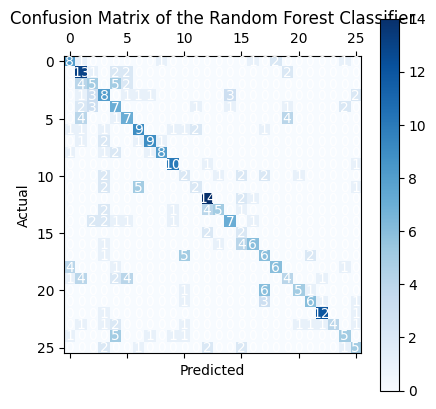

In [15]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_2, prediction)
plt.matshow(cm, cmap=plt.cm.Blues)
plt.colorbar()
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix of the Random Forest Classifier')
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, str(cm[i, j]), ha='center', va='center', color='white')

plt.show()

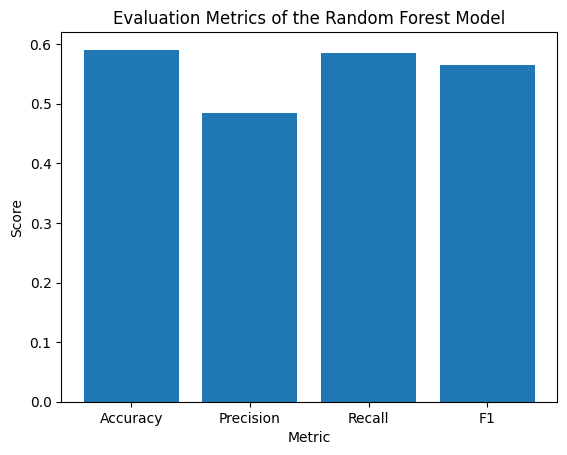

In [16]:
plt.bar(['Accuracy', 'Precision', 'Recall', 'F1'], [accuracy.mean(), precision.mean(), recall.mean(), f1.mean()])
plt.xlabel("Metric")
plt.ylabel("Score")
plt.title("Evaluation Metrics of the Random Forest Model")
plt.show()

The decision tree forest models have good explainability but exhibit average performance. An ANN can be a better choice.
In this notebook, StratifiedKFold does not seem to have provided a significant improvement in accuracy compared to train_test_split().

### ANN Neural Network :

To classify signs based on landmarks, we have trained a decision tree forest, but we can also consider using a neural network. Perhaps this approach will perform better in real-life conditions during predictions on the webcam feed.

Our model will be a simple ANN (Dense neural network)

For our callbacks, we will simply use a checkpoint to save the best weights obtained during the training on all epochs based on the validation accuracy.

In [17]:
reduceLR = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='accuracy', factor=0.1, patience=10, verbose=0,
    mode='auto', min_delta=0.0001, cooldown=0, min_lr=0
)

checkpoint_filepath = './tmp/checkpoint' # Chemin vers le checkpoint de poids de modèle
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)


NUM_CLASSES = 26 # (nos 26 classes de lettes)

#Model Initialization
model = tf.keras.models.Sequential([
    tf.keras.layers.Input((63, )),
    tf.keras.layers.Dropout(0.1),
    tf.keras.layers.Dense(120, activation='elu'),
    tf.keras.layers.Dropout(0.1),
    tf.keras.layers.Dense(60, activation='elu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')
])

#Compiling the Model
model.compile(
    optimizer='nadam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

#Model Fitting
model.fit(
    X_train,
    y_train,
    epochs=1000,
    batch_size=6,
    validation_data=(X_test, y_test),
    callbacks=[model_checkpoint_callback] # On garde le meilleur checkpoint d'epoch
)
# We load the better checkpoiny of the model
model.load_weights(checkpoint_filepath)

Epoch 1/1000
109/109 [==============================] - 2s 4ms/step - loss: 3.2900 - accuracy: 0.0615 - val_loss: 3.1719 - val_accuracy: 0.1370
Epoch 2/1000
109/109 [==============================] - 0s 3ms/step - loss: 3.1835 - accuracy: 0.0815 - val_loss: 3.0726 - val_accuracy: 0.1644
Epoch 3/1000
109/109 [==============================] - 0s 2ms/step - loss: 3.0974 - accuracy: 0.0969 - val_loss: 2.9156 - val_accuracy: 0.2192
Epoch 4/1000
109/109 [==============================] - 0s 2ms/step - loss: 2.9908 - accuracy: 0.1262 - val_loss: 2.7885 - val_accuracy: 0.2329
Epoch 5/1000
109/109 [==============================] - 0s 2ms/step - loss: 2.8419 - accuracy: 0.1708 - val_loss: 2.6524 - val_accuracy: 0.1918
Epoch 6/1000
109/109 [==============================] - 0s 2ms/step - loss: 2.7417 - accuracy: 0.1815 - val_loss: 2.4745 - val_accuracy: 0.2329
Epoch 7/1000
109/109 [==============================] - 0s 2ms/step - loss: 2.6348 - accuracy: 0.2169 - val_loss: 2.3310 - val_accuracy:

3/3 [==============================] - 0s 3ms/step


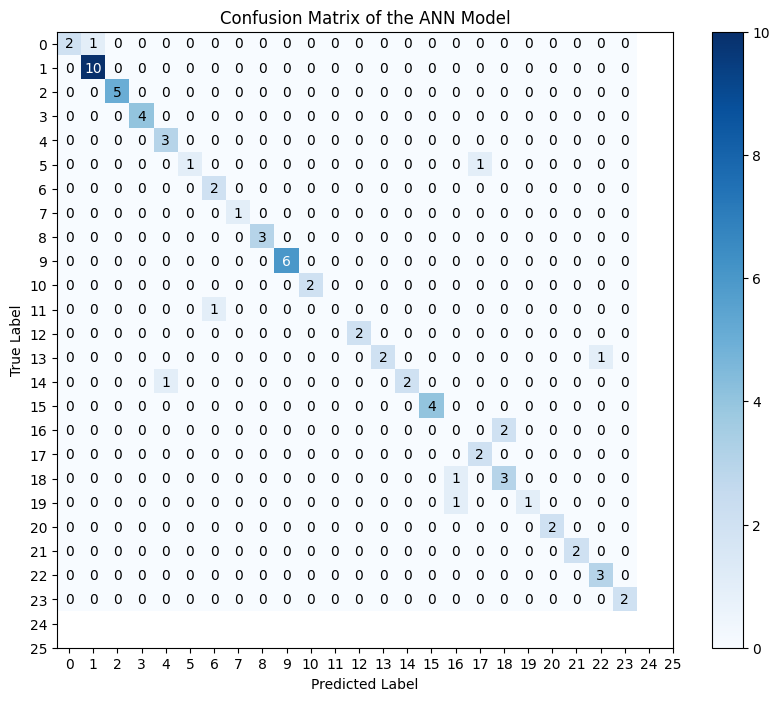

In [22]:
predictions = model.predict(X_test)
y_pred = np.argmax(predictions, axis=1)
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix of the ANN Model')
plt.colorbar()
tick_marks = np.arange(NUM_CLASSES)
plt.xticks(tick_marks, range(NUM_CLASSES))
plt.yticks(tick_marks, range(NUM_CLASSES))
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
thresh = cm.max() / 2.0
for i in range(NUM_CLASSES-2):
    for j in range(NUM_CLASSES-2):
        plt.text(j, i, cm[i, j], ha='center', va='center',
                 color='white' if cm[i, j] > thresh else 'black')

plt.show()


During all the ANN training tests, we can save a model that we like and retrieve it as follows:

model.save('modele/ANN_signes')
model_backup = tf.keras.models.load_model('modele/ANN_signes')

Testing the predcition:

In [23]:
prediction = model.predict(X_test)

3/3 [==============================] - 0s 0s/step


Retrieve the maximum argument of the probability densities outputted by the softmax of the output layer in order to obtain a better prediction.

In [24]:
prediction = [pred.argmax() for pred in prediction]
prediction

[1,
 6,
 20,
 20,
 25,
 1,
 1,
 16,
 17,
 9,
 24,
 16,
 2,
 6,
 14,
 8,
 13,
 20,
 9,
 4,
 7,
 2,
 22,
 9,
 12,
 19,
 3,
 24,
 19,
 4,
 2,
 10,
 19,
 0,
 16,
 4,
 1,
 9,
 1,
 21,
 23,
 9,
 1,
 3,
 24,
 4,
 10,
 24,
 6,
 20,
 1,
 17,
 5,
 3,
 1,
 12,
 1,
 25,
 16,
 8,
 2,
 14,
 0,
 2,
 9,
 23,
 20,
 8,
 1,
 3,
 13,
 22,
 1]

The accuracy of our prediction is as follows:

In [25]:
precision = accuracy_score(y_test, prediction)
print("Précision du modèle :", precision*100, "%")

Précision du modèle : 87.67123287671232 %


## Final Program :

In [26]:
def get_landmarks_feed(image, holistic):
    resultat = []

    detection = holistic.process(image)

    if detection.right_hand_landmarks == None:
        return None
    # We add the location of the results to the keypoints of the detected hand (a priotity to the right hand)
    else :
        for landmark in detection.right_hand_landmarks.landmark:
            resultat.append(landmark.x)
            resultat.append(landmark.y)
            resultat.append(landmark.z)

    return resultat

In [27]:
alphabet = ["A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"]

In [34]:
### Testing the sign detection model on an image.
import tensorflow as tf 
import mediapipe as mp
import cv2
import numpy as np
model = tf.keras.models.load_model('modele/ANN_signes')
mp_drawing = mp.solutions.drawing_utils
mp_holistic = mp.solutions.holistic

def get_landmarks_feed(image, holistic):
    resultat = []

    detection = holistic.process(image)

    if detection.right_hand_landmarks == None:
        return None

    # We add the location of the results to the keypoints of the detected hand (a priotity to the right hand)
    else :
        for landmark in detection.right_hand_landmarks.landmark:
            resultat.append(landmark.x)
            resultat.append(landmark.y)
            resultat.append(landmark.z)

    return resultat

alphabet = ["A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"]

### Testing the sign detection model on an image.
cap = cv2.VideoCapture(0)
key = 0

# We load the detection model outside of the cv2 loop to get better performances on the feed :
try :
    # Paramétrage de mediapipe holistic :
    with mp_holistic.Holistic(min_detection_confidence = 0.6,
                      min_tracking_confidence=0.9) as holistic:

        while cap.isOpened() and key!=27: # Loop to capture cv2
            ret, frame = cap.read()

            # Recoloring the feed with RGB :
            image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            image = cv2.flip(image, 1)
            results = holistic.process(image) # Realising the detection

            landmarks = get_landmarks_feed(image, holistic) # Obtention des keypoints pour la main détectée

            if landmarks != None:
                image = cv2.flip(image, 1)
                #coord = coord_relative(landmarks)
                coord = np.array(landmarks)
                print(coord)

                # Realising the predcition   :
                prediction = model.predict(np.array(landmarks).reshape(1, -1))
                prediction = prediction[0].argmax()

                cv2.putText(frame, str(alphabet[prediction]), (10, 400), cv2.QT_FONT_BOLD, 1, (0, 255, 255))

            # Drawing the Landmarks of each Hand
            mp_drawing.draw_landmarks(frame,
                              results.right_hand_landmarks,
                             mp_holistic.HAND_CONNECTIONS)

            cv2.imshow("Sign Language Object detection Model", frame)

            key = cv2.waitKey(10)
            
except Exception  as e:
    print("Erreur :", e)
    cap.release()
    cv2.destroyAllWindows()

cap.release()
cv2.destroyAllWindows()

[ 3.90803248e-01  6.72011971e-01 -1.55494988e-07  4.42761064e-01
  6.16944909e-01  1.90811753e-02  4.95550126e-01  5.96917987e-01
  2.36544274e-02  5.31762123e-01  6.07592881e-01  2.27215048e-02
  5.51421404e-01  6.31169200e-01  2.27283314e-02  5.39401770e-01
  6.14619136e-01  1.30387042e-02  5.95464647e-01  6.60523355e-01
  1.17813889e-02  5.93327403e-01  6.81887984e-01  1.30166914e-02
  5.79652309e-01  6.82344496e-01  1.52868275e-02  5.39495111e-01
  6.57870293e-01 -3.17665923e-04  5.92818320e-01  7.04229176e-01
  4.04040189e-03  5.81847548e-01  7.18871772e-01  8.11928697e-03
  5.64326406e-01  7.12296963e-01  9.80841555e-03  5.30781388e-01
  7.01974273e-01 -1.22997193e-02  5.81079543e-01  7.42075205e-01
 -4.90888022e-03  5.68486035e-01  7.51086116e-01  4.75373771e-03
  5.51154256e-01  7.41440773e-01  8.93686898e-03  5.14539301e-01
  7.40860045e-01 -2.32487638e-02  5.58320343e-01  7.74654269e-01
 -1.32372966e-02  5.50504506e-01  7.78472841e-01 -4.72422078e-04
  5.36406636e-01  7.68377